# Music Genre Classification



## Task

**The Requirements for this assessment:**

- based on the given dataset, identify stakeholders/audiences who could benefit from your study. Setup your goals together with relevant research questions and choose appropriate machine learning methods to achieve your goal. 

- Deliver your findings to your stakeholders/ audiences with critical insights.


**For each dataset:** 

- follow machine learning pipeline, after EDA and Preprocessing, select, train,apply, evaluate and present at least two models using different machine learning techniques.

- Describe and justify the selection of any appropriate hyper-parameters for each model. Compare the performances of the models. Along with the code cells (preferably with comments), you should use the appropriate markdown cells in the notebook to describe and justify your work.

- Novelty: Explore and innovate new method(s) that cannot be found in literature. <span style="color: orange; font-weight: bold;">MODEL ENSEMBLE OF CLASSIFIER AND VISION!?</span>

Based on your explorations across the three <span style="color: red; font-weight: bold;font-size: 12pt; text-decoration: underline"> ??</span> projects, reflect on the insights gained throughout
your learning journey. 

Consider how each dataset and the comparison of the three challenged
your understanding and forced you to think critically about data analysis, feature extraction, and
model performance. 

What new skills or concepts did you master that you previously found difficult
or confusing? 

Reflect on how this learning experience has deepened your knowledge, not just
technically, but also in terms of how you approach problem-solving. Think about how this process
has influenced your behaviour, perhaps making you more detail-oriented, patient, or the balance
between exploration and exploitation.

## Stakeholders
- Music streaming service to classify the genres

## Goals
- Classify the genres of audio files

## Research Questions
- Can computer vision be used aswell as using the tabular data to improve accuracy?
- What is the most important feature for classifying the genre

### Imports

In [ ]:
import os
import numpy as np
import pandas as pd
import librosa  # audio analysis library
import matplotlib.pyplot as plt
import IPython.display as ipd
import seaborn as sns
import optuna
from sklearn.model_selection import cross_val_score
from dask.distributed import wait
import optuna_integration
import random
from sklearn.model_selection import train_test_split
from PIL import Image
from dask.distributed import Client, LocalCluster, wait

%matplotlib inline
import plotly.express as px
from typing import List
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
from torchvision.io import read_image
from rich import pretty, print
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import torch.optim.adam

# from xgboost import XGBClassifier, XGBRFClassifier
# from xgboost import plot_tree, plot_importance
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.preprocessing import LabelEncoder
from torchmetrics.classification import MulticlassAccuracy
from tqdm.auto import tqdm

pretty.install()

/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment/.venv/lib/python3.12/site-packages/dask/dataframe/__init__.py:49: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


### Colourscheme for the plots

In [2]:
colours = sns.color_palette("Set3")
print("Number of colours: {}".format(len(colours)))

Number of colours: 12

## The data

- genres original - A collection of 10 genres with 100 audio files each, all having a length of 30 seconds.

- images original - A visual representation for each audio file. One way to classify data is through neural networks. Because NNs usually take in some sort of image representation, the audio files were converted to Mel Spectrograms to make this possible.

- 2 CSV files - Containing features of the audio files. One file has for each song (30 seconds long) a mean and variance computed over multiple features that can be extracted from an audio file. The other file has the same structure, but the songs were split before into 3 seconds audio files (this way increasing 10 times the amount of data we put into the classification models). 

In [3]:
data_path = "./Music_data"
print(list(os.listdir(f"{data_path}/genres_original/")))
class_names = list(os.listdir(f"{data_path}/genres_original/"))

['pop', 'metal', 'disco', 'blues', 'reggae', 'classical', 'rock', 'hiphop', 'country', 'jazz']

In [4]:
df_30 = pd.read_csv(f"{data_path}/features_30_sec.csv")  # each song (30 seconds)
df_3 = pd.read_csv(
    f"{data_path}/features_3_sec.csv"
)  # each song split into 10 (3 second) audio files

In [5]:
print("Shape of 30 second features df: {}\n".format(df_30.shape))
df_30.head()

Shape of 30 second features df: (1000, 60)

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [6]:
print("Shape of 3 second features df: {}\n".format(df_3.shape))
df_3.head()

Shape of 3 second features df: (9990, 60)

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


## The datasets

- The advantage of the 3 second audio files are that there is a lot more data

How much more data do we have?

In [7]:
d3 = len(df_3)
d30 = len(df_30)
difference = d3 - d30
percentage_increase = (difference / d30) * 100

print(f"duration 3 rows have {difference} more rows than duration 30.\n")
print(
    f"duration 3 seconds has {percentage_increase:.2f}% more data than 30 second intervals \n"
)

duration 3 rows have 8990 more rows than duration 30.

duration 3 seconds has 899.00% more data than 30 second intervals

## Sample files

The features in the dataset have been extracted from each .wav file using a library such as librosa.

So the first thing I am going to do is explore how these features have been created from looking at a few samples of .wav files to gain a better understanding of exactly what the data is.

Using a sample .wav file to explore audio data - disco.00013.wav
- y is the sound - the sequence of vibrations (audio time series)
- sr is the sample rate. The number of samples of audio per second. 

For each sample I am going to:

- Play the audio file 
- Load the audio file using librosa
- Look at the sound and the sample rate
- Visualise the soundwave
- Look at the tempo
- Create some of the features in the dataset
- Visualise using spectograms 

In [8]:
ipd.Audio(f"{data_path}/genres_original/disco/disco.00013.wav", autoplay=False)

<IPython.lib.display.Audio object>

In [9]:
y, sr = librosa.load(f"{data_path}/genres_original/disco/disco.00013.wav")

In [10]:
print("Type of y: {}\n".format(type(y)))
print("y shape: {}\n".format(np.shape(y)))
print("Sample rate(sr): {}\n".format(sr))

Type of y: <class 'numpy.ndarray'>

y shape: (661794,)

Sample rate(sr): 22050

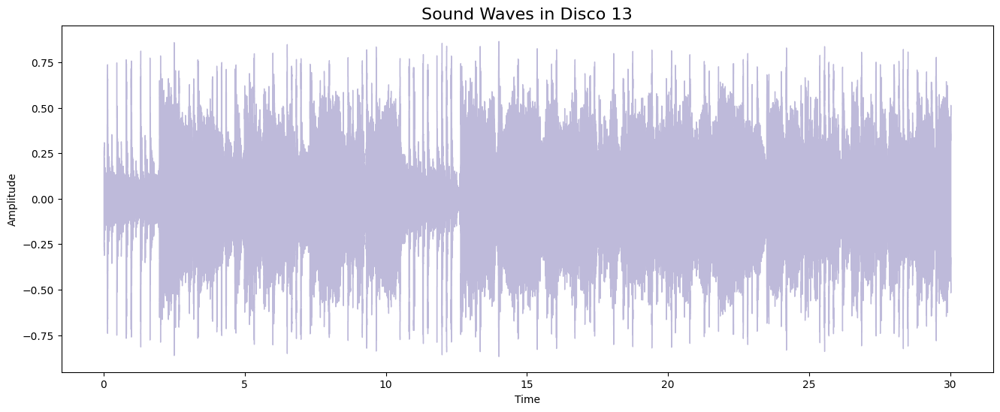

In [11]:
plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=y, sr=sr, color=colours[2])
plt.title("Sound Waves in Disco 13", fontsize=16)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

In [12]:
# trim the trailing and leading silence from the audio file, if there is any...
trimmed_audio_file, index = librosa.effects.trim(y)

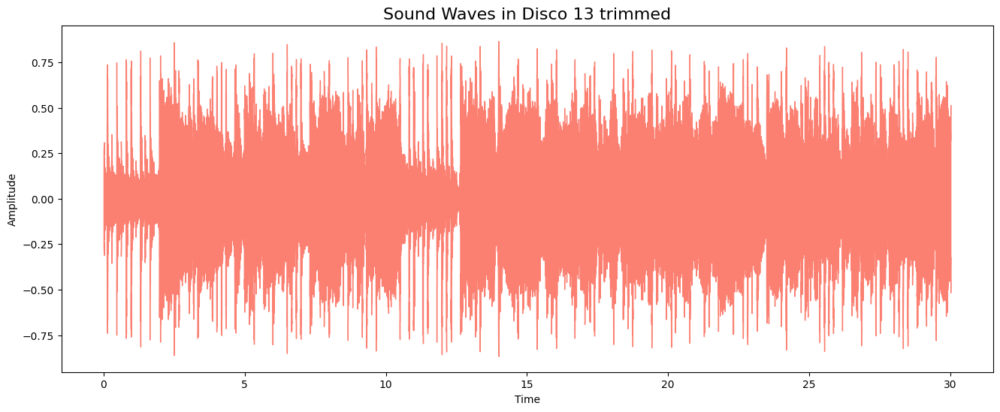

In [13]:
plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=trimmed_audio_file, sr=sr, color=colours[3])
plt.title("Sound Waves in Disco 13 trimmed", fontsize=16)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

Are all the audio files trimmed already? It looks no different!

In [14]:
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
print("Estimated tempo: {} beats per minute".format(tempo))

# Convert the frame indices of beat events into timestamps

beat_times = librosa.frames_to_time(beat_frames, sr=sr)
print(beat_times)

Estimated tempo: [184.5703125] beats per minute

[ 0.32507937  0.65015873  0.99845805  1.32353741  1.67183673  1.9969161
  2.34521542  2.69351474  3.04181406  3.36689342  3.69197279  4.01705215
  4.34213152  4.66721088  5.0155102   5.34058957  5.68888889  6.01396825
  6.36226757  6.68734694  7.0124263   7.33750567  7.68580499  8.01088435
  8.35918367  8.68426304  9.0093424   9.33442177  9.68272109 10.03102041
 10.35609977 10.68117914 11.0062585  11.33133787 11.67963719 12.00471655
 12.32979592 12.65487528 13.0031746  13.35147392 13.67655329 14.00163265
 14.34993197 14.69823129 15.02331066 15.34839002 15.67346939 16.02176871
 16.37006803 16.71836735 17.06666667 17.41496599 17.74004535 18.06512472
 18.41342404 18.7385034  19.08680272 19.43510204 19.78340136 20.13170068
 20.45678005 20.80507937 21.13015873 21.47845805 21.80353741 22.15183673
 22.50013605 22.84843537 23.17351474 23.52181406 23.87011338 24.19519274
 24.54349206 24.86857143 25.21687075 25.54195011 25.86702948 26.19210884
 26.51718821 26.86548753 27.21378685 27.53886621 27.86394558 28.18902494
 28.51410431 28.83918367 29.14104308 29.41968254]

Shape of Decibels object: (1025, 1293)

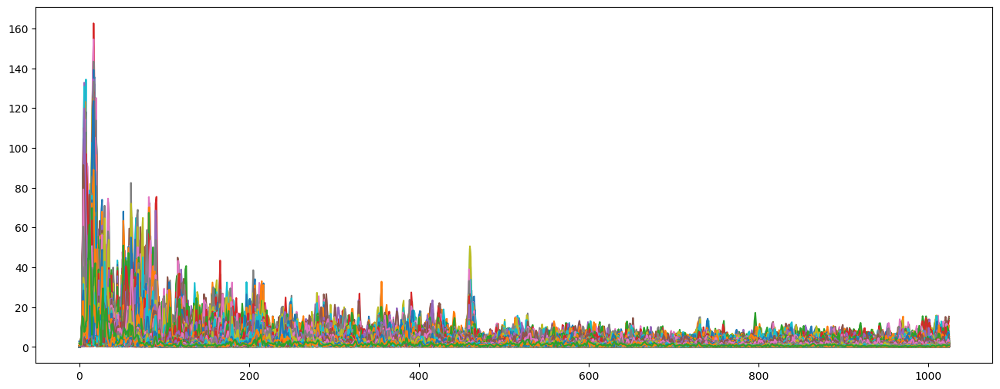

In [15]:
# Default FFT window size
n_fft = 2048  # FFT window size
hop_length = 512  # number audio of frames between STFT columns

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))

print("Shape of Decibels object: {}\n".format(np.shape(D)))

plt.figure(figsize=(16, 6))
plt.plot(D);

### Mel spectrogram example

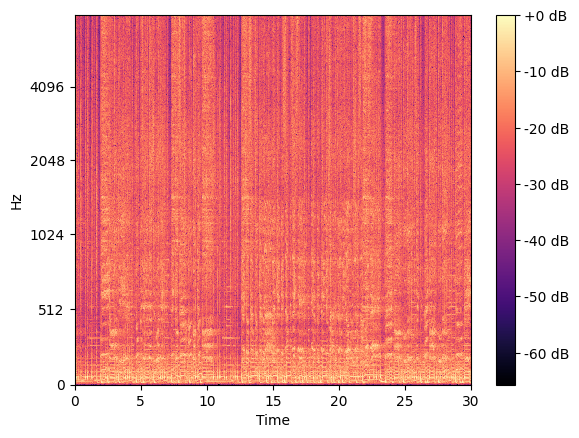

In [16]:
# Create Mel spectrogram
mel_sp = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512)
mel_sp = librosa.power_to_db(D, ref=np.max)
librosa.display.specshow(mel_sp, y_axis="mel", fmax=8000, x_axis="time")
plt.colorbar(format="%+2.0f dB");

## Looking at another sample file 
- is there an obvious difference between genres

In [17]:
ipd.Audio(f"{data_path}/genres_original/classical/classical.00013.wav", autoplay=False)

<IPython.lib.display.Audio object>

In [18]:
y, sr = librosa.load(f"{data_path}/genres_original/classical/classical.00013.wav")
print("Type of y: {}\n".format(type(y)))
print("y shape: {}\n".format(np.shape(y)))
print("Sample rate(sr): {}\n".format(sr))
# trim the trailing and leading silence from the audio file
trimmed_audio_file, index = librosa.effects.trim(y)

Type of y: <class 'numpy.ndarray'>

y shape: (661794,)

Sample rate(sr): 22050

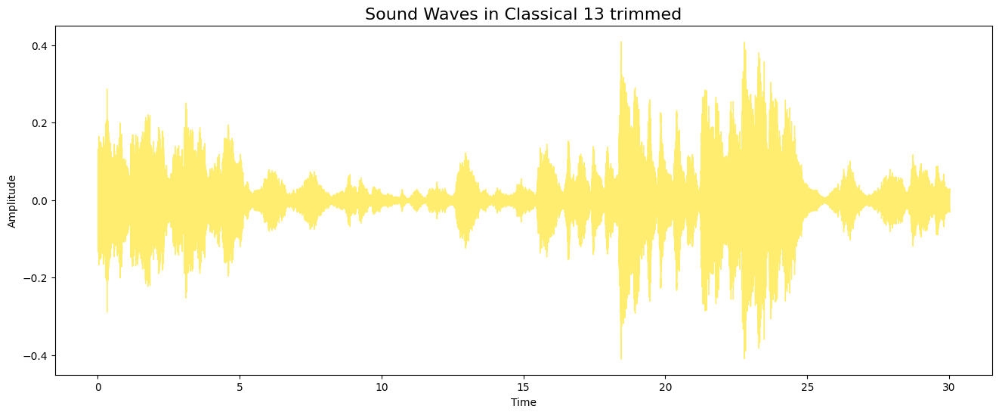

In [19]:
plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=trimmed_audio_file, sr=sr, color=colours[11])
plt.title("Sound Waves in Classical 13 trimmed", fontsize=16)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

Shape of Decibels object: (1025, 1293)

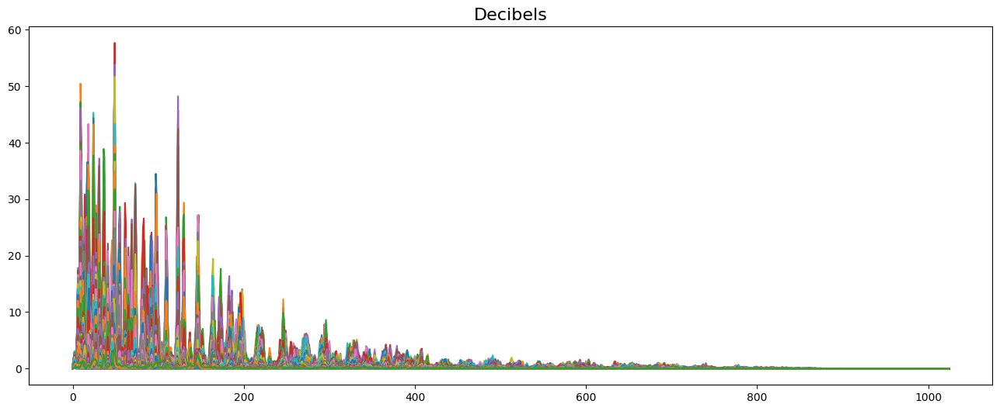

In [20]:
# Default FFT window size
n_fft = 2048  # FFT window size
hop_length = 512  # number audio of frames between STFT columns

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))

print("Shape of Decibels object: {}\n".format(np.shape(D)))

plt.figure(figsize=(16, 6))
plt.title("Decibels", fontsize=16)
plt.plot(D);

In [21]:
# Create spectogram
mel_sp = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512)
mel_sp = librosa.power_to_db(D, ref=np.max)
librosa.display.specshow(mel_sp, y_axis="mel", fmax=8000, x_axis="time")
plt.colorbar(format="%+2.0f dB")
plt.close()

## Beat tracking (for the previous loaded sample)

The output of the beat tracker is an estimate of the tempo (in beats per minute), and an array of frame numbers corresponding to detected beat events.

In [22]:
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

In [ ]:
print("Estimated tempo: {} beats per minute".format(tempo))

beat_times = librosa.frames_to_time(beat_frames, sr=sr)
print(beat_times)

Estimated tempo: [129.19921875] beats per minute

[ 1.18421769  1.64861678  2.13623583  2.62385488  3.06503401  3.55265306
  4.01705215  4.45823129  4.94585034  5.43346939  5.92108844  6.40870748
  6.89632653  7.33750567  7.82512472  8.31274376  8.77714286  9.24154195
  9.70594104 10.19356009 10.68117914 11.16879819 11.63319728 12.12081633
 12.60843537 13.09605442 13.58367347 14.04807256 14.53569161 15.0000907
 15.51092971 15.99854875 16.4861678  16.97378685 17.43818594 17.90258503
 18.39020408 18.90104308 19.38866213 19.85306122 20.31746032 20.78185941
 21.26947846 21.78031746 22.24471655 22.7323356  23.21995465 23.68435374
 24.17197279 24.68281179 25.19365079 25.7044898  26.19210884 26.67972789
 27.16734694 27.65496599 28.14258503 28.63020408 29.09460317 29.55900227]

# EDA


**This is just for the dataframe provided**
## Plan

1. Load and Preview Data

	•	Load the CSV file into a DataFrame and inspect the first few rows to understand the data structure and types.
    
	•	Check the distribution of the label column to see how balanced the classes are.

2. General Data Insights

	•	Shape of Data: Review the number of samples and features.
	•	Data Types: Confirm all feature columns are numerical, and label is categorical.
	•	Null Values: Check for any missing values across all columns.

3. Statistical Summary

	•	Generate summary statistics (mean, median, std, min, max) for all feature columns.
    
	•	Inspect the range of values to understand the distribution and possible need for scaling.

4. Distribution of Each Audio Feature

	•	Histograms/Kernel Density Estimates (KDE): Visualize the distributions of each feature to understand their spread and skewness.
    
	•	Box Plots: Identify outliers in each feature.

5. Correlations

	•	Correlation Matrix: Calculate the correlation between all features to see if any features are highly correlated, which could indicate redundancy and visualise using heatmap.

6. Feature Relationships

	•	Violin/Box Plots by Label: Plot the distributions of each feature grouped by label to observe if certain features distinguish different labels.
    



The two dataframes have already been loaded as:
- df_3: the audio files split into three second clips
- df_30: the original 30 second audio  

In [24]:
df_3.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [25]:
df_30.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


/var/folders/xh/fvvnghrs13n5sqcsmprbn_c80000gn/T/ipykernel_21383/2268236119.py:2: UserWarning: The palette list has more values (12) than needed (10), which may not be intended.
  sns.countplot(data=df_30, x="label", hue="label", palette=colours)


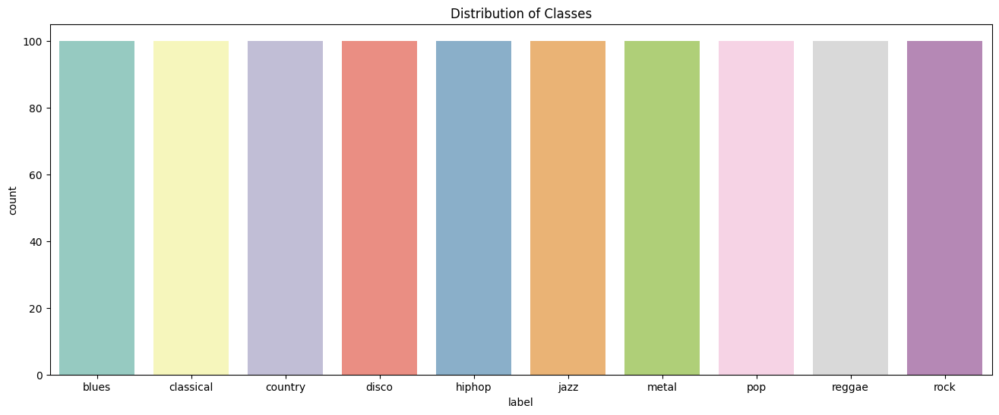

In [26]:
plt.figure(figsize=(16, 6))
sns.countplot(data=df_30, x="label", hue="label", palette=colours)
plt.title("Distribution of Classes")
plt.show()

In [27]:
df_30.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

In [28]:
null_vals = df_30.isnull().sum()
print(null_vals)

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var                  0
mfcc9_mean                 0
mfcc9_var                  0
mfcc10_mean                0
mfcc10_var                 0
mfcc11_mean                0
mfcc11_var                 0
mfcc12_mean                0
mfcc12_var                 0
mfcc13_mean                0
mfcc13_var                 0
mfcc14_mean                0
mfcc14_var                 0
mfcc15_mean                0
mfcc15_var                 0
mfcc16_mean                0
mfcc16_var                 0
mfcc17_mean                0
mfcc17_var                 0
mfcc18_mean                0
mfcc18_var                 0
mfcc19_mean                0
mfcc19_var                 0
mfcc20_mean                0
mfcc20_var                 0
label                      0
dtype: int64

In [29]:
na_vals = df_30.isna().sum()
print(na_vals)

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var                  0
mfcc9_mean                 0
mfcc9_var                  0
mfcc10_mean                0
mfcc10_var                 0
mfcc11_mean                0
mfcc11_var                 0
mfcc12_mean                0
mfcc12_var                 0
mfcc13_mean                0
mfcc13_var                 0
mfcc14_mean                0
mfcc14_var                 0
mfcc15_mean                0
mfcc15_var                 0
mfcc16_mean                0
mfcc16_var                 0
mfcc17_mean                0
mfcc17_var                 0
mfcc18_mean                0
mfcc18_var                 0
mfcc19_mean                0
mfcc19_var                 0
mfcc20_mean                0
mfcc20_var                 0
label                      0
dtype: int64

## Any missing data?

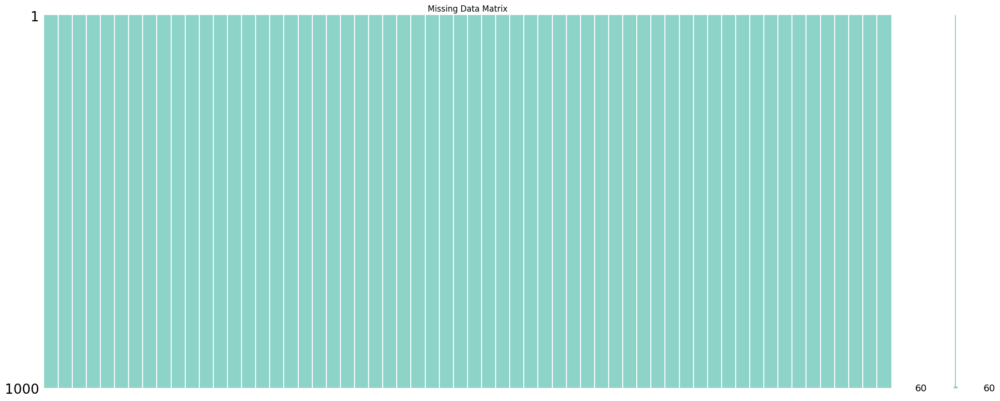

In [30]:
import missingno as msno

msno.matrix(df_30, color=colours[0])
plt.title("Missing Data Matrix")
plt.axis()
plt.show()

## No missing data!

## Statistical summary



In [31]:
df_30.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,662030.846000,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165,4571.549304,...,1.148144,60.730958,-3.966028,62.633624,0.507696,63.712586,-2.328761,66.231930,-1.095348,70.126096
std,1784.073992,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326,1574.791602,...,4.578948,33.781951,4.549697,33.479172,3.869105,34.401977,3.755957,37.174631,3.837007,45.228512
min,660000.000000,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064,749.140636,...,-15.693844,9.169314,-17.234728,13.931521,-11.963694,15.420555,-18.501955,13.487622,-19.929634,7.956583
25%,661504.000000,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428,3380.069642,...,-1.863280,40.376442,-7.207225,40.830875,-2.007015,41.884240,-4.662925,41.710184,-3.368996,42.372865
50%,661794.000000,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036,4658.524473,...,1.212809,52.325077,-4.065605,54.717674,0.669643,54.804890,-2.393862,57.423059,-1.166289,59.186117
75%,661794.000000,0.435942,0.091256,0.175682,0.003577,2691.294667,6.121479e+05,2578.469836,182371.576801,5533.810460,...,4.359662,71.691755,-0.838737,75.040838,3.119212,75.385832,0.150573,78.626444,1.312615,85.375374
max,675808.000000,0.663685,0.108111,0.397973,0.027679,4435.243901,3.036843e+06,3509.646417,694784.811549,8677.672688,...,13.457150,392.932373,11.482946,406.058868,15.388390,332.905426,14.694924,393.161987,15.369627,506.065155


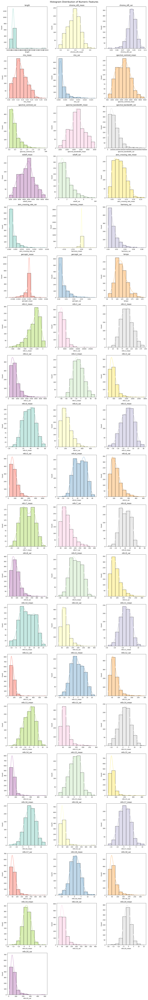

In [32]:
numeric_cols = df_30.select_dtypes(include="number").columns

num_cols = len(numeric_cols)
nrows = (num_cols + 2) // 3


colours = sns.color_palette("Set3", num_cols)

plt.figure(figsize=(15, 5 * nrows))
for i, col in enumerate(numeric_cols):
    plt.subplot(nrows, 3, i + 1)
    sns.histplot(df_30[col], color=colours[i], bins=10, kde=True)
    plt.title(col)

plt.tight_layout()
plt.suptitle("Histogram Distribution of Numeric Features", fontsize=16, y=1.002)
plt.show()

## Any Outliers?

Box plots or violin plots?

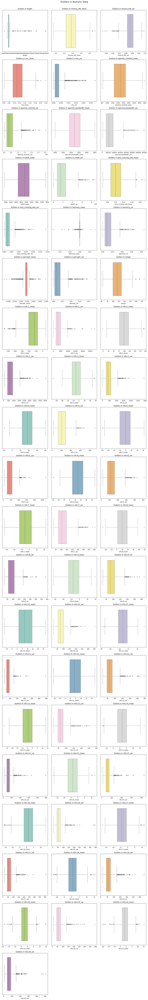

In [33]:
numeric_cols = df_30.select_dtypes(include="number").columns

num_cols = len(numeric_cols)
nrows = (num_cols + 2) // 3
colours = sns.color_palette("Set3", num_cols)

plt.figure(figsize=(15, 5 * nrows))
for i, col in enumerate(numeric_cols):
    plt.subplot(nrows, 3, i + 1)  # Create subplot
    sns.boxplot(x=df_30[col], color=colours[i])
    plt.title(f"Outliers in {col}")
    plt.xlabel(col)

plt.suptitle("Outliers in Numeric Data", fontsize=16, y=1.002)
plt.tight_layout()
plt.show()

## Tempo

- Looking at how the tempo varies across different genres
- What do the outliers show? Is this just because there can be a variety of tempos within a genre?

/var/folders/xh/fvvnghrs13n5sqcsmprbn_c80000gn/T/ipykernel_21383/3319280461.py:2: UserWarning: The palette list has more values (58) than needed (10), which may not be intended.
  sns.boxenplot(data=df_30, x="tempo", hue="label", palette=colours)


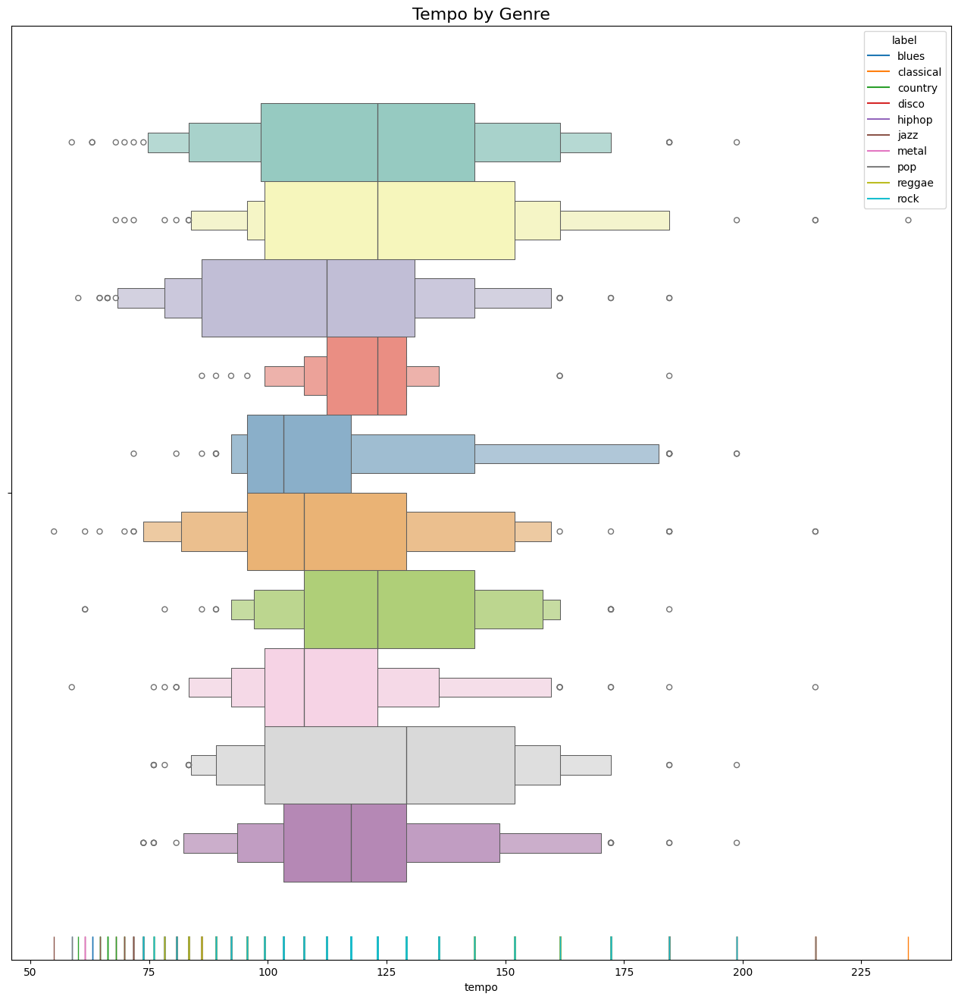

In [34]:
plt.figure(figsize=(16, 16))
sns.boxenplot(data=df_30, x="tempo", hue="label", palette=colours)
sns.rugplot(data=df_30, x="tempo", hue="label")
plt.title("Tempo by Genre", fontsize=16)
plt.show()

## Correlations


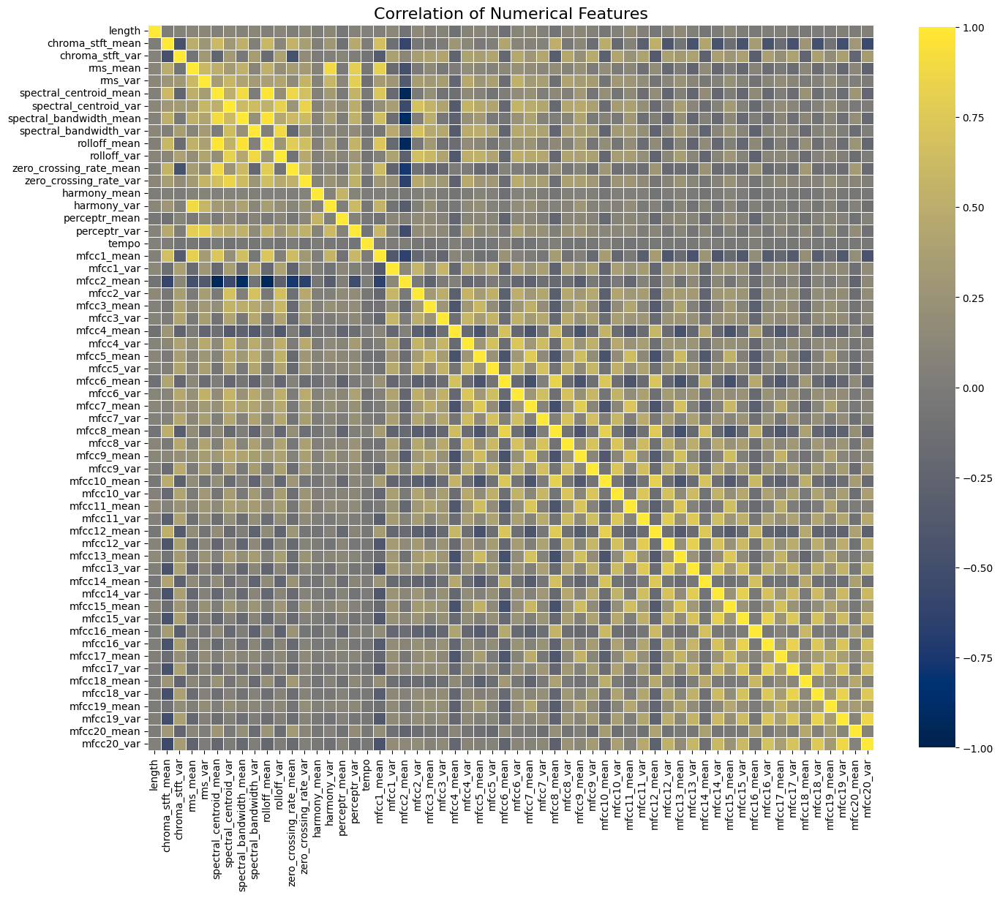

In [35]:
plt.figure(figsize=(16, 16))
corr = df_30.corr(numeric_only=True)
ax = sns.heatmap(
    corr,
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    cmap="cividis",
)
ax.set(xlabel="", ylabel="")
plt.title("Correlation of Numerical Features", fontsize=16)
plt.show()

## EDA summary

### Observations

- The class distribution is even, 100 per class.
- The 30 second dataset is Small
- No missing values
- There are a lot of positively skewed features such as rms_var, rolloff_var and spectoral_centroid_var
- Boxplots show lots of outliers

### Questions
- In the boxplots it looks like thre are lots of outliers. Is this just because even within a genre there can be a lot of variation due to different artists and production style etc...?

# Training and Testing

## The plan for training models

- Three models (a classifier, computer vision, ensemble)

1. Train a classification model on the dataframe

2. Create spectrograms for each .wav file, then train a CNN/vision model 

3. Ensemble three of the highest accuracy classifiers

4. Then Ensemble a clasifier trained on tabular data with the CNN/vision model


# Classifiers using tabular data

## Prepare the data 

In [36]:
import dask.dataframe as dd

In [37]:
df_3 = df_3.drop(columns=["filename"])  # Drop the filename column as not needed
y = df_3["label"]  # genre variable.
X = df_3.loc[:, df_3.columns != "label"]  # select all features


# Normalize so everything using MinMaxScaler

cols = X.columns
min_max_scaler = MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the data that has been scaled
X = pd.DataFrame(np_scaled, columns=cols)

print(X.head())

# Look at converting to a dask dataframe for faster hyperparameter tuning

y_dask = dd.from_pandas(y, npartitions=2)
X_dask = dd.from_pandas(X, npartitions=2)

length  chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
0     0.0          0.355399         0.716757  0.293133  0.107955   
1     0.0          0.367322         0.670347  0.253040  0.044447   
2     0.0          0.373159         0.728067  0.296753  0.141663   
3     0.0          0.399349         0.677066  0.298024  0.075042   
4     0.0          0.355668         0.689113  0.322308  0.052149   

   spectral_centroid_mean  spectral_centroid_var  spectral_bandwidth_mean  \
0                0.262173               0.034784                 0.459205   
1                0.270969               0.018716                 0.470831   
2                0.265293               0.023073                 0.494051   
3                0.238427               0.023187                 0.455246   
4                0.233460               0.016451                 0.451651   

   spectral_bandwidth_var  rolloff_mean  ...  mfcc16_mean  mfcc16_var  \
0                0.094130      0.346153  ...     0.363613    0.056198   
1                0.052261      0.363722  ...     0.468596    0.092912   
2                0.059922      0.378215  ...     0.479681    0.096704   
3                0.066234      0.329587  ...     0.386258    0.067995   
4                0.047830      0.318453  ...     0.438567    0.042500   

   mfcc17_mean  mfcc17_var  mfcc18_mean  mfcc18_var  mfcc19_mean  mfcc19_var  \
0     0.397172    0.066062     0.371828    0.055344     0.380831    0.026797   
1     0.351681    0.074001     0.362068    0.076365     0.418452    0.082414   
2     0.420979    0.050639     0.400536    0.067509     0.433742    0.043841   
3     0.387474    0.050617     0.380430    0.050030     0.405824    0.041898   
4     0.460314    0.083860     0.388590    0.076524     0.409019    0.020763   

   mfcc20_mean  mfcc20_var  
0     0.506746    0.047781  
1     0.593029    0.065548  
2     0.546264    0.036062  
3     0.562204    0.034873  
4     0.517913    0.031713  

[5 rows x 58 columns]

In [38]:
# Create label encoder for the Genre (class label)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.3, random_state=42
)

In [39]:
# Check the shapes of the training and test data
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6993, 58)

(6993,)

(2997, 58)

(2997,)

## Experimenting with models


In [40]:
# function to fit and predict
results_dict = {}  # Dictionary to store the results throughout the notebook


def model_eval(model, model_name: str):
    """
    Takes a machine learning model, trains and tests
    Stores the accuracy in a dictionary of results

    Args:
        model (machine learning model): machine learning model to train and test
        model_name (str): name of the model

    Returns:
        machine learning model: trained model
    """
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    acc = accuracy_score(y_test, predictions)
    print("Accuracy: {} | Model: {}".format(acc, model_name))
    results_dict[model_name] = acc

    return model

## Create a Dictionary to store all results from the models and convert to a dataframe at the end

### Training Sklearn models with no changes to hyperparameters

In [41]:
dtc_clf = DecisionTreeClassifier()
model_eval(dtc_clf, "DecisionTreeClassifier")

nb_clf = GaussianNB()
model_eval(nb_clf, "GaussianNB")

rf_clf = RandomForestClassifier()


model_eval(rf_clf, "RandomForestClassifier")

Accuracy: 0.6436436436436437 | Model: DecisionTreeClassifier

Accuracy: 0.5195195195195195 | Model: GaussianNB

Accuracy: 0.8732065398732065 | Model: RandomForestClassifier

RandomForestClassifier()

In [42]:
print(results_dict)

{
    'DecisionTreeClassifier': 0.6436436436436437,
    'GaussianNB': 0.5195195195195195,
    'RandomForestClassifier': 0.8732065398732065
}

## Next I am going to train some different models to the Sklearn ones used above

- XGB classifier
- LGB Classifier
- Catboost Classifier

In [43]:
xgb_clf = XGBClassifier()
lgbm_clf = LGBMClassifier()
cb_clf = CatBoostClassifier()

model_eval(xgb_clf, "XGBClassifier")
model_eval(lgbm_clf, "LGBMClassifier")
model_eval(cb_clf, "CatBoostClassifier")

Accuracy: 0.8962295628962296 | Model: XGBClassifier

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14328
[LightGBM] [Info] Number of data points in the train set: 6993, number of used features: 57
[LightGBM] [Info] Start training from score -2.329103
[LightGBM] [Info] Start training from score -2.315973
[LightGBM] [Info] Start training from score -2.285992
[LightGBM] [Info] Start training from score -2.304446
[LightGBM] [Info] Start training from score -2.320331
[LightGBM] [Info] Start training from score -2.281782
[LightGBM] [Info] Start training from score -2.305880
[LightGBM] [Info] Start training from score -2.255519
[LightGBM] [Info] Start training from score -2.324707
[LightGBM] [Info] Start training from score -2.304446


Accuracy: 0.9062395729062396 | Model: LGBMClassifier

Learning rate set to 0.087378
0:	learn: 2.1683037	total: 84.7ms	remaining: 1m 24s
1:	learn: 2.0727497	total: 108ms	remaining: 53.9s
2:	learn: 1.9936382	total: 131ms	remaining: 43.4s
3:	learn: 1.9127009	total: 149ms	remaining: 37.2s
4:	learn: 1.8363061	total: 168ms	remaining: 33.5s
5:	learn: 1.7706154	total: 188ms	remaining: 31.1s
6:	learn: 1.7180564	total: 209ms	remaining: 29.6s
7:	learn: 1.6625492	total: 238ms	remaining: 29.5s
8:	learn: 1.6217411	total: 260ms	remaining: 28.6s
9:	learn: 1.5821760	total: 280ms	remaining: 27.8s
10:	learn: 1.5381617	total: 299ms	remaining: 26.9s
11:	learn: 1.4967125	total: 318ms	remaining: 26.2s
12:	learn: 1.4608735	total: 339ms	remaining: 25.8s
13:	learn: 1.4280077	total: 361ms	remaining: 25.4s
14:	learn: 1.4013910	total: 386ms	remaining: 25.4s
15:	learn: 1.3739818	total: 411ms	remaining: 25.3s
16:	learn: 1.3472912	total: 437ms	remaining: 25.3s
17:	learn: 1.3235835	total: 464ms	remaining: 25.3s
18:	learn: 1.3026450	total: 485ms	remaining: 25s
19:	learn: 

Accuracy: 0.9112445779112446 | Model: CatBoostClassifier

In [44]:
print(results_dict)

{
    'DecisionTreeClassifier': 0.6436436436436437,
    'GaussianNB': 0.5195195195195195,
    'RandomForestClassifier': 0.8732065398732065,
    'XGBClassifier': 0.8962295628962296,
    'LGBMClassifier': 0.9062395729062396,
    'CatBoostClassifier': 0.9112445779112446
}

### The accuracies of the models trained above:

- Catboost: Accuracy: 0.9112445779112446
- LGBM Classifier: Accuracy: 0.9062395729062396
- XGB Classifier: Accuracy: 0.8962295628962296

These show a significant increase in accuracy over the sklearn models trained above

## Next: hyperparameter tune!

For this I am going to use two different methods to carry out hyperparameter tuning:

- Grid search
- Optuna 
- Cross validation of the models will be implemented with CV being 5 across all.

>I also want to experiment with how I can speed up the process of hyperparameter tuning as using a large search speace can take some time.

**After the first run the code to run the search will be commented out to save time and the results stored in a dictionary to be passed as parameters to the models**

### Catboost classifier

In [ ]:
model = CatBoostClassifier()

# Parameter grid
grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "n_estimators": [300, 500, 1000],
    "depth": [4, 6, 8],
    "l2_leaf_reg": [3, 5, 10],
    "colsample_bylevel": [0.8, 1.0],
    "grow_policy": ["SymmetricTree", "Depthwise"],
}

grid_search_result = model.grid_search(grid, X_train, y_train)

In [ ]:
grid_search_result.get("params")

### Output from CatBoost hyperparameter grid search: Best parameters

{
    'grow_policy': 'SymmetricTree',
    'rsm': 1,
    'depth': 8,
    'learning_rate': 0.1,
    'l2_leaf_reg': 3,
    'iterations': 1000
}

In [47]:
params_from_gs = {
    "grow_policy": "SymmetricTree",
    "rsm": 1,
    "depth": 8,
    "learning_rate": 0.1,
    "l2_leaf_reg": 3,
    "iterations": 1000,
}

# Passing the best parameters found to the CatboostClassifier
cb_tuned_clf = CatBoostClassifier(**params_from_gs)
cb_tuned_clf = model_eval(cb_tuned_clf, "CatBoostClassifier_hp_tuned")

0:	learn: 2.1456109	total: 102ms	remaining: 1m 42s
1:	learn: 2.0124672	total: 178ms	remaining: 1m 28s
2:	learn: 1.9002974	total: 266ms	remaining: 1m 28s
3:	learn: 1.8157195	total: 344ms	remaining: 1m 25s
4:	learn: 1.7401002	total: 414ms	remaining: 1m 22s
5:	learn: 1.6650401	total: 483ms	remaining: 1m 20s
6:	learn: 1.6103316	total: 559ms	remaining: 1m 19s
7:	learn: 1.5591040	total: 635ms	remaining: 1m 18s
8:	learn: 1.5038996	total: 719ms	remaining: 1m 19s
9:	learn: 1.4545375	total: 794ms	remaining: 1m 18s
10:	learn: 1.4100639	total: 891ms	remaining: 1m 20s
11:	learn: 1.3690473	total: 992ms	remaining: 1m 21s
12:	learn: 1.3284956	total: 1.12s	remaining: 1m 24s
13:	learn: 1.2923959	total: 1.22s	remaining: 1m 26s
14:	learn: 1.2572516	total: 1.3s	remaining: 1m 25s
15:	learn: 1.2272233	total: 1.37s	remaining: 1m 24s
16:	learn: 1.1986170	total: 1.45s	remaining: 1m 24s
17:	learn: 1.1742867	total: 1.53s	remaining: 1m 23s
18:	learn: 1.1491522	total: 1.61s	remaining: 1m 23s
19:	learn: 1.1243791	to

Accuracy: 0.9152485819152486 | Model: CatBoostClassifier_hp_tuned

After CatBoost Gridsearch hyperparameter search:
- Accuracy: 0.9152485819152486

## LGBM classifier hyperparameter tuning

This is going to be done using Optuna
- Attempt to speed up and optimise using dask for distrubuted processing

In [ ]:
# Create a local cluster
cluster = LocalCluster()
client = Client(cluster)

print(client)

# Using local dask to speed up the study
backend_storage = optuna.storages.InMemoryStorage()
dask_storage = optuna.integration.DaskStorage(storage=backend_storage)


def objective(trial):

    params = {
        "objective": "multiclass",
        "metric": "multi_logloss",
        "boosting_type": "gbdt",
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "num_leaves": trial.suggest_int("num_leaves", 7, 255),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=50),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 50),
        "min_child_weight": trial.suggest_float(
            "min_child_weight", 1e-3, 10.0, log=True
        ),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "subsample_freq": trial.suggest_int("subsample_freq", 1, 10),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.4, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 10.0, log=True),
        "scale_pos_weight": trial.suggest_float("scale_pos_weight", 1.0, 50.0),
    }

    model = LGBMClassifier(**params)
    model.fit(X_train, y_train)
    score = cross_val_score(
        model, X_train, y_train, cv=5, scoring="accuracy", n_jobs=-1
    )
    return score.mean()


try:

    study_lgbm = optuna.create_study(
        direction="maximize", storage=dask_storage, study_name="LGBM_music_study"
    )
    # study_lgbm.optimize(objective, n_trials=7,show_progress_bar=True, n_jobs=-1 )

    futures = [
        client.submit(
            study_lgbm.optimize,
            objective,
            n_trials=50,
            pure=False,
            show_progress_bar=True,
            n_jobs=-1,
        )
    ]

    _ = wait(futures)

except Exception as e:
    print("Error: {}".format(e))

print(study_lgbm.best_params)
lgbm_best_params = study_lgbm.best_params
print(lgbm_best_params)

cluster.close()
client.close()

<Client: 'tcp://127.0.0.1:52129' processes=4 threads=8, memory=8.00 GiB>

/var/folders/xh/fvvnghrs13n5sqcsmprbn_c80000gn/T/ipykernel_21383/3691876157.py:8: ExperimentalWarning: DaskStorage is experimental (supported from v3.1.0). The interface can change in the future.
  dask_storage = optuna.integration.DaskStorage(storage=backend_storage)


In [49]:
orig_tuned_params = {
    "max_depth": 12,
    "num_leaves": 75,
    "learning_rate": 0.03343403250021652,
    "n_estimators": 550,
    "min_child_samples": 47,
    "min_child_weight": 0.0010198761141177943,
    "subsample": 0.8795657511671271,
    "subsample_freq": 9,
    "colsample_bytree": 0.5535880187358653,
    "reg_alpha": 1.5144020964774322e-05,
    "reg_lambda": 1.3964482240806669e-06,
    "scale_pos_weight": 46.58243090504811,
}

# Train the LGBM classifier using the best parameters found
original_tuned_lgbm_clf = LGBMClassifier(**orig_tuned_params)
original_tuned_lgbm_clf = model_eval(original_tuned_lgbm_clf, "LGBMClassifier_hp_tuned")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14328
[LightGBM] [Info] Number of data points in the train set: 6993, number of used features: 57
[LightGBM] [Info] Start training from score -2.329103
[LightGBM] [Info] Start training from score -2.315973
[LightGBM] [Info] Start training from score -2.285992
[LightGBM] [Info] Start training from score -2.304446
[LightGBM] [Info] Start training from score -2.320331
[LightGBM] [Info] Start training from score -2.281782
[LightGBM] [Info] Start training from score -2.305880
[LightGBM] [Info] Start training from score -2.255519
[LightGBM] [Info] Start training from score -2.324707
[LightGBM] [Info] Start training from score -2.304446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

Accuracy: 0.9185852519185852 | Model: LGBMClassifier_hp_tuned

## XGB classifier hyperparameter tuning

Using optuna and dask

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from dask.distributed import wait
import optuna_integration

from dask.distributed import Client, LocalCluster, wait

cluster = LocalCluster()
client = Client(cluster)

print(client)

backend_storage = optuna.storages.InMemoryStorage()
dask_storage = optuna.integration.DaskStorage(storage=backend_storage)


def objective(trial):

    params = {
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 10),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "reg_alpha": trial.suggest_float("reg_alpha", 0, 10),
        "reg_lambda": trial.suggest_float("reg_lambda", 1, 10),
    }

    model = XGBClassifier(**params)
    model.fit(X_train, y_train)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="accuracy")
    return score.mean()


try:
    study_xgb = optuna.create_study(
        direction="maximize", storage=dask_storage, study_name="XGB_music_study"
    )
    # study_lgbm.optimize(objective, n_trials=7,show_progress_bar=True, n_jobs=-1 )

    futures = [
        client.submit(
            study_xgb.optimize,
            objective,
            n_trials=50,
            pure=False,
            show_progress_bar=True,
        )
    ]

    _ = wait(futures)

except Exception as e:
    print("Error: {}".format(e))

print(study_xgb.best_params)
xgb_best_params = study_xgb.best_params
print(xgb_best_params)

cluster.close()
client.close()

<Client: 'tcp://127.0.0.1:52196' processes=4 threads=8, memory=8.00 GiB>

/var/folders/xh/fvvnghrs13n5sqcsmprbn_c80000gn/T/ipykernel_21383/1946162252.py:15: ExperimentalWarning: DaskStorage is experimental (supported from v3.1.0). The interface can change in the future.
  dask_storage = optuna.integration.DaskStorage(storage=backend_storage)


In [51]:
xgb_tuned_params = {
    "max_depth": 4,
    "learning_rate": 0.16111810865118664,
    "n_estimators": 214,
    "subsample": 0.7964006664079039,
    "colsample_bytree": 0.6018463499841923,
    "gamma": 0.03800623545465706,
    "min_child_weight": 1,
    "reg_alpha": 0.12870662123776988,
    "reg_lambda": 6.55095583388307,
}

# Train the xgb classifier using the best parameters found
xgb_t_clf = XGBClassifier(**xgb_tuned_params)
xgb_t_clf = model_eval(xgb_t_clf, "XGBClassifier_hp_tuned")

Accuracy: 0.8892225558892226 | Model: XGBClassifier_hp_tuned

## Model 3: Ensemble 

### 1. Ensemble the classifiers trained on the tabular data
    - Voting classifier
    - Stack classifier


In [52]:
from sklearn.ensemble import VotingClassifier, StackingClassifier

print("CatBoost predict shape:", cb_tuned_clf.predict(X_test).shape)
print("LightGBM predict shape:", original_tuned_lgbm_clf.predict(X_test).shape)
print("XGBoost predict shape:", xgb_t_clf.predict(X_test).shape)

from sklearn.base import BaseEstimator, ClassifierMixin
import numpy as np


# Wrapper to allow catboost to work in ensemble as the predictions are normally in a 2d array
class CatBoostWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y)
        return self

    def predict(self, X):
        return np.ravel(self.model.predict(X))

    def predict_proba(self, X):
        return self.model.predict_proba(X)


# The parameters obtained through the hyperparameter tuning above
params_from_gs = {
    "grow_policy": "SymmetricTree",
    "rsm": 1,
    "depth": 8,
    "learning_rate": 0.1,
    "l2_leaf_reg": 3,
    "iterations": 1000,
}

orig_tuned_params = {
    "max_depth": 12,
    "num_leaves": 75,
    "learning_rate": 0.03343403250021652,
    "n_estimators": 550,
    "min_child_samples": 47,
    "min_child_weight": 0.0010198761141177943,
    "subsample": 0.8795657511671271,
    "subsample_freq": 9,
    "colsample_bytree": 0.5535880187358653,
    "reg_alpha": 1.5144020964774322e-05,
    "reg_lambda": 1.3964482240806669e-06,
    "scale_pos_weight": 46.58243090504811,
}

xgb_tuned_params = {
    "max_depth": 4,
    "learning_rate": 0.16111810865118664,
    "n_estimators": 214,
    "subsample": 0.7964006664079039,
    "colsample_bytree": 0.6018463499841923,
    "gamma": 0.03800623545465706,
    "min_child_weight": 1,
    "reg_alpha": 0.12870662123776988,
    "reg_lambda": 6.55095583388307,
}

xgb_t_clf = XGBClassifier(**xgb_tuned_params)
original_tuned_lgbm_clf = LGBMClassifier(**orig_tuned_params)
cb_tuned_clf = CatBoostClassifier(**params_from_gs)
cb_tuned_clf = CatBoostWrapper(cb_tuned_clf)  # Use the wrapper created above

# voting classifier
ensemble = VotingClassifier(
    estimators=[("lgbm_clf", original_tuned_lgbm_clf), ("cb_clf", cb_tuned_clf)],
    voting="hard",
)
ensemble.fit(X_train, y_train)
ensemble_preds = ensemble.predict(X_test)
ensemble_acc = accuracy_score(y_test, ensemble_preds)

# For the stack it does not need to have the predictions in the same shape as the others
cb_tuned_clf = CatBoostClassifier(**params_from_gs)

# Stack classifier
stack_ensemble = StackingClassifier(
    estimators=[("lgbm_clf", original_tuned_lgbm_clf), ("cb_clf", cb_tuned_clf)],
    final_estimator=CatBoostClassifier(),
)
stack_ensemble.fit(X_train, y_train)
stack_preds = stack_ensemble.predict(X_test)
stack_acc = accuracy_score(y_test, stack_preds)

print("ensemble accuracy: {} \nStack accuracy: {}".format(ensemble_acc, stack_acc))

results_dict["Voting Ensemble accuracy"] = ensemble_acc
results_dict["Stacking Ensemble accuracy"] = stack_acc

CatBoost predict shape:
(2997, 1)

LightGBM predict shape:
(2997,)

XGBoost predict shape:
(2997,)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14328
[LightGBM] [Info] Number of data points in the train set: 6993, number of used features: 57
[LightGBM] [Info] Start training from score -2.329103
[LightGBM] [Info] Start training from score -2.315973
[LightGBM] [Info] Start training from score -2.285992
[LightGBM] [Info] Start training from score -2.304446
[LightGBM] [Info] Start training from score -2.320331
[LightGBM] [Info] Start training from score -2.281782
[LightGBM] [Info] Start training from score -2.305880
[LightGBM] [Info] Start training from score -2.255519
[LightGBM] [Info] Start training from score -2.324707
[LightGBM] [Info] Start training from score -2.304446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment/.venv/lib/python3.12/site-packages/sklearn/preprocessing/_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


ensemble accuracy: 0.9172505839172506 
Stack accuracy: 0.9265932599265932

## Look at the results

In [53]:
print(results_dict)
results_dataframe = pd.DataFrame(
    list(results_dict.items()), columns=["Model", "Accuracy"]
)
results_dataframe = results_dataframe.sort_values(
    by="Accuracy", ascending=False
).reset_index(drop=True)
results_dataframe.to_csv("tabular_music_data.csv")  # Save to a .csv file
results_dataframe

{
    'DecisionTreeClassifier': 0.6436436436436437,
    'GaussianNB': 0.5195195195195195,
    'RandomForestClassifier': 0.8732065398732065,
    'XGBClassifier': 0.8962295628962296,
    'LGBMClassifier': 0.9062395729062396,
    'CatBoostClassifier': 0.9112445779112446,
    'CatBoostClassifier_hp_tuned': 0.9152485819152486,
    'LGBMClassifier_hp_tuned': 0.9185852519185852,
    'XGBClassifier_hp_tuned': 0.8892225558892226,
    'Voting Ensemble accuracy': 0.9172505839172506,
    'Stacking Ensemble accuracy': 0.9265932599265932
}

,Model,Accuracy
0,Stacking Ensemble accuracy,0.926593
1,LGBMClassifier_hp_tuned,0.918585
2,Voting Ensemble accuracy,0.917251
3,CatBoostClassifier_hp_tuned,0.915249
4,CatBoostClassifier,0.911245
5,LGBMClassifier,0.906240
6,XGBClassifier,0.896230
7,XGBClassifier_hp_tuned,0.889223
8,RandomForestClassifier,0.873207
9,DecisionTreeClassifier,0.643644


        ### What do the results mean?!

# Image data 

For the next part I am going to use the audio data provided on kaggle and convert each .wav file to a spectrogram. 

A Spectrogram is a photographic representation of a spectrum of frequencies of a signal over time. (Oxford Language, 2024)

## The Plan

    1. Convert all the audio files to spectrograms for the dataset
    2. Explore and visualise the Spectrogram data
    3. Split the data into train and test sizes (80/20 split) and create *PyTorch datasets* (train and test)
    4. Create dataloaders
    5. Build Model
    6. Train and test model
    7. Combine the features from the CNN with the tabular data?



## Vision model using pytorch - spectrograms

**There are Spectrograms in the data from kaggle but not mentioned in assessment brief! So creating my own to gather an understanding on how they were created and what they are...**



### First create a function to take all the .wav samples and create spectrograms

- Needs to be in the same format as the .wav files, a directory for each genre but with spectrograms instead


In [54]:
print(os.getcwd())

/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment

In [55]:
def iterate_directories(verbose=False):
    """
    Iterates through audio data directories and
    to allow a function to convert to spectrogram to process each .wav file

    Args:
        verbose (bool, optional): Print outputs. Defaults to False.
    """
    cwd = os.getcwd()
    if verbose:
        print("Current working directory: {}".format(cwd))

    music_data_dir = "Music_data/genres_original"

    new_data_directory = "spectrogram_data"

    # Create a new directory for the spectrograms creeated
    if not os.path.exists(new_data_directory):
        os.makedirs(new_data_directory)

    directories_in_data = [
        d
        for d in os.listdir(music_data_dir)
        if os.path.isdir(os.path.join(music_data_dir, d))
    ]
    if verbose:
        print(directories_in_data)

    for directory_name in directories_in_data:
        sub_dir_path = os.path.join(new_data_directory, directory_name)
        if not os.path.exists(sub_dir_path):
            os.makedirs(sub_dir_path)
            if verbose:
                print(f"Created subdirectory: {sub_dir_path}")
        else:
            if verbose:
                print(f"Subdirectory already exists: {sub_dir_path}")

    # Next is to iterate through the music data genres data and create spectrograms for each wav file and
    # Store in correct directory

    for genre in directories_in_data:
        genre_path = os.path.join(music_data_dir, genre)
        output_path = os.path.join(new_data_directory, genre)
        if verbose:
            print("Input dir: {} | Output dir: {}\n".format(genre_path, output_path))

        for filename in os.listdir(genre_path):
            file_path = os.path.join(genre_path, filename)
            if verbose:
                print("File path: {}\n".format(file_path))

            if os.path.isfile(file_path):
                output_file_path = os.path.join(
                    output_path, os.path.splitext(filename)[0] + ".png"
                )
                if os.path.exists(output_file_path):
                    if verbose:
                        print(
                            f"Spectrogram already exists: {output_file_path}. Skipping."
                        )
                    continue
                create_mel_spectrogram(file_path, output_file_path)

    print("Completed Processing")


def create_mel_spectrogram(audio_file, output_file_path):
    """
    Takes an audio file loads it and creates a mel spectrogram
    saves the figure as an image in the correct output directory

    Args:
        audio_file (string): filepath for the .wav audio file
        output_file_path (String): filepath to save image
    """
    try:
        y, sr = librosa.load(audio_file)
        mel_sp = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512)
        mel_sp = librosa.power_to_db(mel_sp, ref=np.max)

        plt.figure(figsize=(3, 3))
        librosa.display.specshow(
            mel_sp, sr=sr, hop_length=512, x_axis=None, y_axis=None
        )
        plt.axis("off")
        # plt.show()

        # Save the image
        plt.savefig(output_file_path, bbox_inches="tight", pad_inches=0)
        plt.close()
        print(f"Saved spectrogram image to {output_file_path}")
    except Exception as e:
        print("Error loading: {} | Error: {}".format(audio_file, e))


iterate_directories()

/var/folders/xh/fvvnghrs13n5sqcsmprbn_c80000gn/T/ipykernel_21383/2289020155.py:78: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file)
/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment/.venv/lib/python3.12/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Error loading: Music_data/genres_original/jazz/jazz.00054.wav | Error:

Completed Processing

Spectrograms cerated in the directory spectrogram_data
Error processing one file `jazz.00054.wav`

## Looking at a sample of the images that were created

Sample image: ./spectrogram_data/reggae/reggae.00023.png

Type of image data: <class 'numpy.ndarray'>

Image shape: (231, 232, 4)

Sample image: 
[[[0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  ...
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]]

 [[0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  ...
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]]

 [[0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  ...
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]
  [0.         0.         0.01568628 1.        ]]

 ...

 [[0.99607843 0.62352943 0.42745098 1.        ]
  [0.99607843 0.78431374 0.54901963 1.        ]
  [0.99607843 0.84313726 0.6        1.        ]
  ...
  [0.9411765  0.37254903 0.36862746 1.        ]
  [0.99607843 0.7254902  0.49803922 1.        ]
  [0.99215686 0.59607846 0.4117647  1.        ]]

 [[0.92156863 0.34117648 0.3764706  1.        ]
  [0.8392157  0.27058825 0.42352942 1.        ]
  [0.99607843 0.7137255  0.4862745  1.        ]
  ...
  [0.89411765 0.30980393 0.39215687 1.        ]
  [0.9843137  0.5137255  0.37254903 1.        ]
  [0.8156863  0.25490198 0.43529412 1.        ]]

 [[0.92156863 0.34117648 0.3764706  1.        ]
  [0.8392157  0.27058825 0.42352942 1.        ]
  [0.99607843 0.7137255  0.4862745  1.        ]
  ...
  [0.89411765 0.30980393 0.39215687 1.        ]
  [0.9843137  0.5137255  0.37254903 1.        ]
  [0.8156863  0.25490198 0.43529412 1.        ]]]

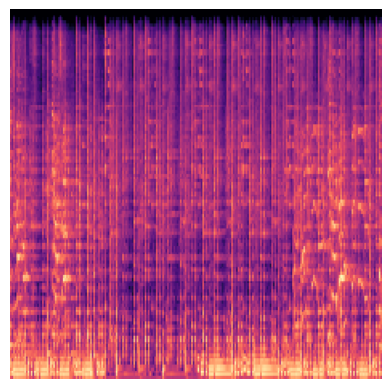

In [56]:
spectrogram_data_filepath = "./spectrogram_data"
sample_image = f"{spectrogram_data_filepath}/reggae/reggae.00023.png"
print("Sample image: {}".format(sample_image))
sample_image = plt.imread(sample_image)
print("Type of image data: {}".format(type(sample_image)))
print("Image shape: {}".format(sample_image.shape))
print("Sample image: \n{}".format(sample_image))
plt.imshow(sample_image)
plt.axis("off")
plt.show()

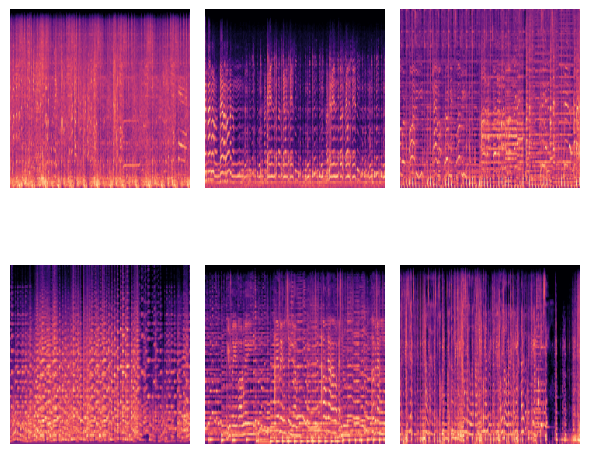

In [57]:
samples = [
    "./spectrogram_data/hiphop/hiphop.00095.png",
    "./spectrogram_data/blues/blues.00028.png",
    "./spectrogram_data/disco/disco.00004.png",
    "./spectrogram_data/classical/classical.00059.png",
    "./spectrogram_data/country/country.00098.png",
    "./spectrogram_data/rock/rock.00014.png",
]
rows = 2
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(6, 6))
axes = axes.flatten()

for i, sample in enumerate(samples):
    img = plt.imread(sample)
    axes[i].imshow(img)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

## Create pytorch dataset 

### Device code for Pytorch

In [58]:
print("Torch version: {}".format(torch.__version__))
device = "cuda" if torch.cuda.is_available() else "mps"
print("Device type: {}".format(device))

Torch version: 2.5.0

Device type: mps

In [59]:
def iterate_directory(dir_path):
    """
    Function to check the data looks correct

    Args:
        dir_path (str): the path of the directory to iterate
    """
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(
            f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'."
        )


iterate_directory("./spectrogram_data")

There are 10 directories and 0 images in './spectrogram_data'.

There are 0 directories and 100 images in './spectrogram_data/pop'.

There are 0 directories and 100 images in './spectrogram_data/metal'.

There are 0 directories and 100 images in './spectrogram_data/disco'.

There are 0 directories and 100 images in './spectrogram_data/blues'.

There are 0 directories and 100 images in './spectrogram_data/reggae'.

There are 0 directories and 100 images in './spectrogram_data/classical'.

There are 0 directories and 100 images in './spectrogram_data/rock'.

There are 0 directories and 100 images in './spectrogram_data/hiphop'.

There are 0 directories and 100 images in './spectrogram_data/country'.

There are 0 directories and 99 images in './spectrogram_data/jazz'.

As shown above we now have folders for each class with the spectrogram data
- Jazz has one less due to the error with one of the audio files

### Create the training and test split
- Iterate through the spectrogram data directory and split each genre into train/test sets

In [60]:
data_dir = "./spectrogram_data"
train_ratio = 0.8

train_image_paths = []
train_labels = []
test_image_paths = []
test_labels = []

# List of genre directories
genres = os.listdir(data_dir)

# Iterate through the classes
for genre in genres:
    genre_dir = os.path.join(data_dir, genre)
    if not os.path.isdir(genre_dir):
        continue

    # Get all images in the genre directory
    images = [
        os.path.join(genre_dir, img)
        for img in os.listdir(genre_dir)
        if img.endswith(("png", "jpg", "jpeg"))
    ]

    # Split images into train and test sets ratio 0.8 - 80/20 split
    train_imgs, test_imgs = train_test_split(
        images, train_size=train_ratio, random_state=42
    )

    # Add to lists with genre as label
    train_image_paths.extend(train_imgs)
    train_labels.extend([genre] * len(train_imgs))
    test_image_paths.extend(test_imgs)
    test_labels.extend([genre] * len(test_imgs))

# Check it all looks corrct after split
print("Number of training images: {}".format(len(train_image_paths)))
print("Number of training labels: {}".format(len(train_labels)))
print("Number of test images: {}".format(len(test_image_paths)))
print("Number of test labels: {}".format(len(test_labels)))

Number of training images: 799

Number of training labels: 799

Number of test images: 200

Number of test labels: 200

### Create the Dataset using the PyTorch dataset class
- Spectrogram dataset class
- Set up train and test transforms
- Create train and test dataset

In [61]:
class SpectrogramDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.classes = list(set(labels))
        self.class_to_idx = self.create_class_idx()
        self.transform = transform

    def create_class_idx(self):
        return {class_name: idx for idx, class_name in enumerate(self.classes)}

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        class_name = self.labels[index]  # Get the class label directly from labels
        class_idx = self.class_to_idx[class_name]  # Map class label to index
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, class_idx

In [62]:
# Augment train data
train_transforms = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        # transforms.Normalize([0.5815, 0.2205, 0.4177], [0.2402, 0.1366, 0.1217])
    ]
)

# Don't augment test data, only reshape to match train data size
test_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),  # transforms.Normalize([0.5815, 0.2205, 0.4177], [0.2402, 0.1366, 0.1217])
    ]
)

In [63]:
train_data = SpectrogramDataset(
    train_image_paths, train_labels, transform=train_transforms
)
test_data = SpectrogramDataset(test_image_paths, test_labels, transform=test_transforms)

print(train_data, test_data)
print(
    "Train data size: {} | Test Data Size: {}".format(len(train_data), len(test_data))
)
print(train_data.classes)
class_names = train_data.classes
print(train_data.class_to_idx)

<__main__.SpectrogramDataset object at 0x3486a6210> <__main__.SpectrogramDataset object at 0x3486a5580>

Train data size: 799 | Test Data Size: 200

['reggae', 'classical', 'rock', 'jazz', 'country', 'disco', 'blues', 'pop', 'hiphop', 'metal']

{
    'reggae': 0,
    'classical': 1,
    'rock': 2,
    'jazz': 3,
    'country': 4,
    'disco': 5,
    'blues': 6,
    'pop': 7,
    'hiphop': 8,
    'metal': 9
}

## Create dataloaders

In [64]:
train_dataloader = DataLoader(train_data, batch_size=16, shuffle=True)
test_dataloader = DataLoader(test_data, batch_size=16, shuffle=False)

print(train_dataloader, "\n", test_dataloader)

<torch.utils.data.dataloader.DataLoader object at 0x3112ac530> 
 <torch.utils.data.dataloader.DataLoader object at 0x348646c00>

### Example from the dataloader

In [65]:
img_batch_sample, label_batch_sample = next(iter(train_dataloader))
print(
    f"Image shape: {img_batch_sample.shape} -> [batch_size, color_channels, height, width]"
)
print(f"Label shape: {label_batch_sample.shape}")
print(label_batch_sample)

Image shape: torch.Size([16, 3, 224, 224]) ->

Label shape: torch.Size([16])

tensor([3, 0, 3, 3, 6, 2, 4, 3, 9, 6, 1, 3, 2, 5, 1, 6])

### Then create a NN 

First is a basic CNN based on TinyVGG which is a good starting point

In [115]:
class Model1(nn.Module):
    def __init__(self, input_shape, hidden_units, output_shape):
        super().__init__()
        self.block_1 = nn.Sequential(
            nn.Conv2d(
                in_channels=input_shape,
                out_channels=hidden_units,
                kernel_size=4,
                stride=1,
                padding=1,
            ),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.block_2 = nn.Sequential(
            nn.Conv2d(
                in_channels=hidden_units,
                out_channels=hidden_units,
                kernel_size=5,
                stride=1,
                padding=1,
            ),
            nn.ReLU(),
            nn.Conv2d(
                in_channels=hidden_units,
                out_channels=hidden_units,
                kernel_size=3,
                stride=1,
                padding=1,
            ),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(), nn.Linear(in_features=93312, out_features=output_shape)
        )

    def forward(self, x):
        x = self.block_1(x)
        x = self.block_2(x)
        x = self.classifier(x)
        return x


torch.manual_seed(12)
model_1 = Model1(input_shape=3, hidden_units=32, output_shape=10)
model_1


Model1(
  (block_1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_2): Sequential(
    (0): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=93312, out_features=10, bias=True)
  )
)

### Training and testing functions & Loss, optim and accuracy set up

In [ ]:
# Setup loss and optimizer
import torch.optim as optim


def train_step(
    model: torch.nn.Module,
    data_loader: torch.utils.data.DataLoader,
    loss_fn: torch.nn.Module,
    optimizer: torch.optim.Optimizer,
    accuracy_fn,
    device: torch.device = device,
):
    """
    Performs the training loop for the pytorch model

    Args:
        model (torch.nn.Module): model to train
        data_loader (torch.utils.data.DataLoader): train dataloader
        loss_fn (torch.nn.Module): loss function
        optimizer (torch.optim.Optimizer): optimiser
        accuracy_fn (function): accuracy function
        device (torch.device, optional): Defaults to device to run on.
    """
    train_loss, train_acc = 0, 0
    model.to(device)
    for batch, (X, y) in enumerate(data_loader):
        # Send data to GPU or MPS if run on macbook
        X, y = X.to(device), y.to(device)

        #  Forward pass
        y_pred = model(X)

        # Calculate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss
        train_acc += accuracy_fn(y, y_pred.argmax(dim=1))  # Get labels

        # Optimizer zero grad
        optimizer.zero_grad()

        #  Loss backward
        loss.backward()

        # Optimizer step
        optimizer.step()

    # Calculate loss and accuracy per epoch
    train_loss /= len(data_loader)
    train_acc /= len(data_loader)
    print(f"Train loss: {train_loss:.5f} | Train accuracy: {train_acc:.2f}%")


def test_step(
    data_loader: torch.utils.data.DataLoader,
    model: torch.nn.Module,
    loss_fn: torch.nn.Module,
    accuracy_fn,
    device: torch.device = device,
):
    """
    Performs test loop on pytorch model

    Args:
        data_loader (torch.utils.data.DataLoader): test dataloader
        model (torch.nn.Module): model to tesst
        loss_fn (torch.nn.Module): loss function
        accuracy_fn (_type_): accuracy function
        device (torch.device, optional): device to run on. Defaults to device.
    """
    test_loss, test_acc = 0, 0
    model.to(device)
    model.eval()
    with torch.inference_mode():
        for X, y in data_loader:
            # Send data to device
            X, y = X.to(device), y.to(device)

            # Forward pass
            test_pred = model(X)

            test_loss += loss_fn(test_pred, y)
            test_acc += accuracy_fn(
                y, y_pred=test_pred.argmax(dim=1)  # Get prediction labels
            )

        test_loss /= len(data_loader)
        test_acc /= len(data_loader)
        print(f"Test loss: {test_loss:.5f} | Test accuracy: {test_acc:.2f}%\n")

### Training and testing the CNN
- Set the number of epochs for the training and test loop

In [117]:
model_1 = Model1(input_shape=3, hidden_units=32, output_shape=10)

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model_1.parameters(), lr=0.008)
# optimizer = torch.optim.Adam(params=model_1.parameters(), lr=0.002)


def accuracy_fn(y_true, y_pred):
    """
    Accuracy metric
    """
    correct = (
        torch.eq(y_true, y_pred).sum().item()
    )  # Sum how many are correct in predictions
    acc = (correct / len(y_pred)) * 100  # number of correct preds / total predictions
    return acc


scheduler = optim.lr_scheduler.StepLR(
    optimizer, step_size=42, gamma=0.1
)  # Adjust every 7 epochs by a factor of 0.1

epochs = 50
for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n---------")
    train_step(
        data_loader=train_dataloader,
        model=model_1,
        loss_fn=loss_fn,
        optimizer=optimizer,
        accuracy_fn=accuracy_fn,
        device=device,
    )
    test_step(
        data_loader=test_dataloader,
        model=model_1,
        loss_fn=loss_fn,
        accuracy_fn=accuracy_fn,
        device=device,
    )
    scheduler.step()  # Step the learning rate scheduler

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch: 0
---------

Train loss: 2.30245 | Train accuracy: 12.26%

Test loss: 2.28065 | Test accuracy: 9.62%

Epoch: 1
---------

Train loss: 2.24274 | Train accuracy: 18.53%

Test loss: 2.16305 | Test accuracy: 23.56%

Epoch: 2
---------

Train loss: 2.15727 | Train accuracy: 18.77%

Test loss: 2.05609 | Test accuracy: 29.33%

Epoch: 3
---------

Train loss: 2.08282 | Train accuracy: 24.53%

Test loss: 2.02511 | Test accuracy: 26.44%

Epoch: 4
---------

Train loss: 1.96428 | Train accuracy: 28.76%

Test loss: 2.08782 | Test accuracy: 25.00%

Epoch: 5
---------

Train loss: 1.97238 | Train accuracy: 29.78%

Test loss: 1.91476 | Test accuracy: 34.13%

Epoch: 6
---------

Train loss: 1.86231 | Train accuracy: 30.91%

Test loss: 1.87216 | Test accuracy: 27.88%

Epoch: 7
---------

Train loss: 1.80302 | Train accuracy: 34.65%

Test loss: 2.02780 | Test accuracy: 24.04%

Epoch: 8
---------

Train loss: 1.72685 | Train accuracy: 40.17%

Test loss: 1.72777 | Test accuracy: 39.90%

Epoch: 9
---------

Train loss: 1.76246 | Train accuracy: 35.63%

Test loss: 1.82175 | Test accuracy: 29.81%

Epoch: 10
---------

Train loss: 1.67525 | Train accuracy: 42.05%

Test loss: 1.75085 | Test accuracy: 40.87%

Epoch: 11
---------

Train loss: 1.68494 | Train accuracy: 38.29%

Test loss: 1.81606 | Test accuracy: 28.37%

Epoch: 12
---------

Train loss: 1.59385 | Train accuracy: 43.80%

Test loss: 1.67583 | Test accuracy: 34.62%

Epoch: 13
---------

Train loss: 1.56065 | Train accuracy: 43.68%

Test loss: 1.69437 | Test accuracy: 38.46%

Epoch: 14
---------

Train loss: 1.57799 | Train accuracy: 43.95%

Test loss: 1.75353 | Test accuracy: 37.98%

Epoch: 15
---------

Train loss: 1.55681 | Train accuracy: 45.17%

Test loss: 1.67513 | Test accuracy: 40.38%

Epoch: 16
---------

Train loss: 1.51845 | Train accuracy: 47.32%

Test loss: 1.60691 | Test accuracy: 42.79%

Epoch: 17
---------

Train loss: 1.50462 | Train accuracy: 45.41%

Test loss: 1.90266 | Test accuracy: 36.54%

Epoch: 18
---------

Train loss: 1.50501 | Train accuracy: 46.45%

Test loss: 1.51705 | Test accuracy: 46.15%

Epoch: 19
---------

Train loss: 1.46371 | Train accuracy: 47.56%

Test loss: 1.59394 | Test accuracy: 43.27%

Epoch: 20
---------

Train loss: 1.45397 | Train accuracy: 46.93%

Test loss: 1.56906 | Test accuracy: 42.31%

Epoch: 21
---------

Train loss: 1.42509 | Train accuracy: 49.07%

Test loss: 1.59921 | Test accuracy: 43.27%

Epoch: 22
---------

Train loss: 1.43216 | Train accuracy: 47.67%

Test loss: 1.54558 | Test accuracy: 44.23%

Epoch: 23
---------

Train loss: 1.38573 | Train accuracy: 49.67%

Test loss: 1.70882 | Test accuracy: 42.31%

Epoch: 24
---------

Train loss: 1.37283 | Train accuracy: 50.69%

Test loss: 1.58426 | Test accuracy: 38.94%

Epoch: 25
---------

Train loss: 1.34308 | Train accuracy: 50.69%

Test loss: 1.49556 | Test accuracy: 45.19%

Epoch: 26
---------

Train loss: 1.33067 | Train accuracy: 51.68%

Test loss: 1.47672 | Test accuracy: 46.63%

Epoch: 27
---------

Train loss: 1.26127 | Train accuracy: 55.82%

Test loss: 1.80071 | Test accuracy: 41.83%

Epoch: 28
---------

Train loss: 1.22824 | Train accuracy: 56.06%

Test loss: 1.59608 | Test accuracy: 41.83%

Epoch: 29
---------

Train loss: 1.21097 | Train accuracy: 56.57%

Test loss: 1.56532 | Test accuracy: 47.12%

Epoch: 30
---------

Train loss: 1.15060 | Train accuracy: 56.58%

Test loss: 1.61108 | Test accuracy: 43.75%

Epoch: 31
---------

Train loss: 1.12563 | Train accuracy: 60.81%

Test loss: 1.38060 | Test accuracy: 50.48%

Epoch: 32
---------

Train loss: 1.06591 | Train accuracy: 62.94%

Test loss: 1.44479 | Test accuracy: 52.88%

Epoch: 33
---------

Train loss: 1.07517 | Train accuracy: 60.94%

Test loss: 1.41575 | Test accuracy: 49.04%

Epoch: 34
---------

Train loss: 1.02634 | Train accuracy: 63.09%

Test loss: 1.31363 | Test accuracy: 52.40%

Epoch: 35
---------

Train loss: 1.03982 | Train accuracy: 63.96%

Test loss: 1.47409 | Test accuracy: 50.48%

Epoch: 36
---------

Train loss: 0.95795 | Train accuracy: 65.08%

Test loss: 1.43374 | Test accuracy: 50.00%

Epoch: 37
---------

Train loss: 0.91131 | Train accuracy: 68.96%

Test loss: 1.54181 | Test accuracy: 49.52%

Epoch: 38
---------

Train loss: 0.93530 | Train accuracy: 66.85%

Test loss: 1.45200 | Test accuracy: 50.48%

Epoch: 39
---------

Train loss: 0.88684 | Train accuracy: 69.22%

Test loss: 1.50684 | Test accuracy: 50.48%

Epoch: 40
---------

Train loss: 0.84804 | Train accuracy: 67.95%

Test loss: 1.52960 | Test accuracy: 50.00%

Epoch: 41
---------

Train loss: 0.82440 | Train accuracy: 69.97%

Test loss: 1.49270 | Test accuracy: 56.25%

Epoch: 42
---------

Train loss: 0.65129 | Train accuracy: 78.71%

Test loss: 1.32164 | Test accuracy: 59.13%

Epoch: 43
---------

Train loss: 0.60799 | Train accuracy: 78.60%

Test loss: 1.30251 | Test accuracy: 58.65%

Epoch: 44
---------

Train loss: 0.60381 | Train accuracy: 79.22%

Test loss: 1.29718 | Test accuracy: 58.65%

Epoch: 45
---------

Train loss: 0.55834 | Train accuracy: 81.60%

Test loss: 1.32168 | Test accuracy: 56.25%

Epoch: 46
---------

Train loss: 0.58717 | Train accuracy: 80.37%

Test loss: 1.29832 | Test accuracy: 58.17%

Epoch: 47
---------

Train loss: 0.59074 | Train accuracy: 80.10%

Test loss: 1.30519 | Test accuracy: 57.21%

Epoch: 48
---------

Train loss: 0.57085 | Train accuracy: 79.85%

Test loss: 1.30575 | Test accuracy: 61.06%

Epoch: 49
---------

Train loss: 0.53329 | Train accuracy: 80.60%

Test loss: 1.34567 | Test accuracy: 59.62%

### Comapring against a very basic NN
- Just for comparison to see if a fully connected neural network can perform better on a spectrogram dataet

In [130]:
class LinearModel(nn.Module):
    def __init__(self, input_features, output_features, hidden_units=32):
        super().__init__()
        self.linear_layer_stack = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=input_features, out_features=hidden_units),
            nn.ReLU(),
            nn.Linear(in_features=hidden_units, out_features=hidden_units),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(in_features=hidden_units, out_features=output_features),
        )

    def forward(self, x):
        return self.linear_layer_stack(x)


model_4 = LinearModel(input_features=150528, output_features=10, hidden_units=32).to(
    device
)
print(model_4)

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_4.parameters(), lr=0.007)

epochs = 5
for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n---------")
    train_step(
        data_loader=train_dataloader,
        model=model_4,
        loss_fn=loss_fn,
        optimizer=optimizer,
        accuracy_fn=accuracy_fn,
        device=device,
    )
    test_step(
        data_loader=test_dataloader,
        model=model_4,
        loss_fn=loss_fn,
        accuracy_fn=accuracy_fn,
        device=device,
    )

LinearModel(
  (linear_layer_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=150528, out_features=32, bias=True)
    (2): ReLU()
    (3): Linear(in_features=32, out_features=32, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Linear(in_features=32, out_features=10, bias=True)
  )
)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 0
---------

Train loss: 13.84375 | Train accuracy: 10.88%

Test loss: 2.30447 | Test accuracy: 9.62%

Epoch: 1
---------

Train loss: 2.30806 | Train accuracy: 10.01%

Test loss: 2.30297 | Test accuracy: 9.62%

Epoch: 2
---------

Train loss: 2.30542 | Train accuracy: 10.00%

Test loss: 2.30330 | Test accuracy: 9.62%

Epoch: 3
---------

Train loss: 2.30511 | Train accuracy: 7.64%

Test loss: 2.30207 | Test accuracy: 9.62%

Epoch: 4
---------

Train loss: 2.30437 | Train accuracy: 9.01%

Test loss: 2.30363 | Test accuracy: 9.62%

### Experimenting - combining the features extracted from the spectrograms and the tabular data

In [133]:
def make_predictions(
    data_loader: torch.utils.data.DataLoader,
    model: torch.nn.Module,
):
    """
    Performs the forward pass on a trained CNN
    Adapted from the test step above

    Args:
        data_loader (torch.utils.data.DataLoader): Train/ test dataloader to be passed
        model (torch.nn.Module): The model that is used to make predicitons

    Returns:
        List: A list containing the features obtained from the CNN
    """
    predictions = []
    model.to(device)
    model.eval()  # put model in eval mode
    with torch.inference_mode():
        for X, y in data_loader:
            # Send data to device
            X, y = X.to(device), y.to(device)

            # Forward pass
            test_pred = model(X)
            predictions.append(test_pred.cpu().numpy())  # Move data back from device

    return predictions


# Use the function to extract the features from the CNN
cnn_features = make_predictions(train_dataloader, model_1)
cnn_test_features = make_predictions(test_dataloader, model_1)

cnn_features = cnn_features[:-1]  # Remove the final feature as a different shape
cnn_test_features = cnn_test_features[:-1]
cnn_features = np.array(cnn_features)
cnn_test_features = np.array(cnn_test_features)


print("cnn_features shape after squeezing:", cnn_features.shape)
cnn_features = cnn_features.reshape(cnn_features.shape[0], -1)
cnn_test_features = cnn_test_features.reshape(cnn_test_features.shape[0], -1)

"""cnn_features = min_max_scaler.fit_transform(cnn_features)
cnn_test_features = min_max_scaler.fit_transform(cnn_test_features)"""


# Check the new shape of cnn_features
print("cnn_features shape after reshaping:", cnn_features.shape)
print("cnn_test features shape after reshaping:", cnn_test_features.shape)

X_train_subset = X_train.iloc[:49]  # or X_train_np[:49, :]
X_test_subset = X_test.iloc[:12]  # or X_train_np[:49, :]

X_combined = np.hstack([X_train_subset, cnn_features])
X_test_combined = np.hstack([X_test_subset, cnn_test_features])

print("X combined shape: {}".format(X_combined.shape))
print("X_test combined shape: {}".format(X_test_combined.shape))
stack_ensemble = StackingClassifier(
    estimators=[("lgbm_clf", original_tuned_lgbm_clf), ("xgb_clf", xgb_t_clf)],
    final_estimator=cb_tuned_clf,
)

# Train the ensemble
stack_ensemble.fit(X_combined, y_train[:49])

# make predicitons
stack_preds = stack_ensemble.predict(X_test_combined)
stack_acc = accuracy_score(y_test[:12], stack_preds)
print(stack_acc * 100)

cnn_features shape after squeezing:
(49, 16, 10)

cnn_features shape after reshaping:
(49, 160)

cnn_test features shape after reshaping:
(12, 160)

X combined shape: (49, 218)

X_test combined shape: (12, 218)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 49, number of used features: 0
[LightGBM] [Info] Start training from score -2.282382
[LightGBM] [Info] Start training from score -2.100061
[LightGBM] [Info] Start training from score -2.793208
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -3.198673
[LightGBM] [Info] Start training from score -2.505526
[LightGBM] [Info] Start training from score -2.100061
[LightGBM] [Info] Start training from score -2.282382
[LightGBM] [Info] Start training from score -2.505526
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment/.venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 39, number of used features: 0
[LightGBM] [Info] Start training from score -2.277267
[LightGBM] [Info] Start training from score -2.054124
[LightGBM] [Info] Start training from score -2.970414
[LightGBM] [Info] Start training from score -2.054124
[LightGBM] [Info] Start training from score -2.970414
[LightGBM] [Info] Start training from score -2.564949
[LightGBM] [Info] Start training from score -2.054124
[LightGBM] [Info] Start training from score -2.277267
[LightGBM] [Info] Start training from score -2.564949
[LightGBM] [Info] Start training from score -1.871802
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warnin

/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment/.venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


0:	learn: 2.2916787	total: 1.54ms	remaining: 1.54s
1:	learn: 2.2655987	total: 6.08ms	remaining: 3.04s
2:	learn: 2.2405419	total: 10.3ms	remaining: 3.42s
3:	learn: 2.2113259	total: 13.7ms	remaining: 3.41s
4:	learn: 2.1819407	total: 16.5ms	remaining: 3.28s
5:	learn: 2.1566234	total: 19.5ms	remaining: 3.23s
6:	learn: 2.1300266	total: 22.8ms	remaining: 3.23s
7:	learn: 2.1028599	total: 24.6ms	remaining: 3.05s
8:	learn: 2.0749895	total: 26.3ms	remaining: 2.89s
9:	learn: 2.0486786	total: 29.3ms	remaining: 2.9s
10:	learn: 2.0202522	total: 32.4ms	remaining: 2.91s
11:	learn: 1.9986937	total: 33.8ms	remaining: 2.79s
12:	learn: 1.9849710	total: 34.2ms	remaining: 2.6s
13:	learn: 1.9592903	total: 37.3ms	remaining: 2.63s
14:	learn: 1.9376049	total: 39ms	remaining: 2.56s
15:	learn: 1.9134238	total: 40.6ms	remaining: 2.5s
16:	learn: 1.8885374	total: 43.5ms	remaining: 2.51s
17:	learn: 1.8656865	total: 46.8ms	remaining: 2.55s
18:	learn: 1.8414316	total: 50.2ms	remaining: 2.59s
19:	learn: 1.8184860	total:

/Users/markpeacock/MSc_artificial_intelligence/Machine learning/Assessment/.venv/lib/python3.12/site-packages/sklearn/preprocessing/_label.py:153: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


16.666666666666664

### Results of passing spectrogram features to the tabular classifier

- Accuracy Not Good: 16.666%

### Research Questions

-  Could this improve if I find a way to improve the accuracy of the CNN on the spectrograms? For example with a larger dataset?

## Results and Findings

From Looking at the datasets the 3 second dataset had the advantage over the 30 second for the amount of data. More data is better. So for the training and testing of classfication models I used the three second dataset. 

Through the EDA I found that it looked like there was a lot of skewed data and outliers for most features. 
Being music and without information on who had produced each audio file, I found that although a genre contained a lot of similarities, there can also be a lot of variation between songs even of a certain genre. And this is especially common whaen you explore different artists interpretations of a genre. So for this reason I chose to not do anything about the skewness and outliers and put it down to a unique reason of artistic difference. 

I first used just the tabular data to train classification models. For the metric I used accuracy as it is the clearest to see how well a model is performing. 
I then carrie out hyperparameter tuning using two different methods. Grid search which was a method I used before and Optuna study which is something I was not as familiar with. I found the increases were good through this however it could be quite time consuming. For this reason I looked at ways to speed it up and came across dask and using local clusters for distributed processing. 

I found the best models were XGB, LGBM and CatBoost. 
I then used the esemble method and got an improvement in accuracy, with a final model of **92.6% accuracy**.

The next thing I wanted to do was look at using the actual audio files as it was stated in the assessment specificaton that the audio files could be used on kaggle. 
The best way I found to do this was by creating MEL spectrograms for each audio file to be passed through a neural network. 
However I knew the dataset was very small with only 100 items per class I thought it would be hard to get a well performing model. 
I also wanted to combine the features extracted from the neural netork (specifically a CNN) with the classifier to see if this would work. 

I created custom pytorch datasets and dataloaders (train and test ) for the image data.
I then trained a CNN - based on the TinyVGG architecture, as I needed a simple model for the limited dataset. 
The accuracy was very low and the loss stopped decreasing and the model started to overfit. Leading to a high training accuracy and a much lower test accuracy. 
I then made use of a learning rate scheduler. This reduced the overfitting however the accuracy stayed low. At around epoch 28 the accuracy was only 44%. 

After changing the learning rate and scheduling, **the final accuracy on the test dataset obtained was: 59% trained for 50 epochs**.
At 59% test accuracy, it effectively is only going to be correct just over half the time which is not an acceptable performance, but I feel this is due to the limited dataset. 

Just for comparison, I decided to attempt to train a fully connected neural network to see how the performance of that compared to the CNN. This model would not get higher than 9.62 test accuracy, regardless of the parameters such as learning rate. 
So compared to this the CNN has fitted to the data well, and 

I then wanted to see if as a novel approach I could combine the classifier trained on tabular data along with the features extracted from the MEL spectrogram dataset I created. Because of the low accuracy of the CNN I was hoping that passing it to a well performing classifier that had been trained on various features obtained from the audio data it would give a decent accurracy. However the accuracy was very low. 

The finding of this approach are that with a small dataset this does not work as well as I would want it to. The lower accuracy of the CNN causes the tabular classifier to be unable to obtain a good performance when using the features ectracted.